In [1]:
import numpy as np
import torch
import torch.nn as nn
import pandas as pd
import nibabel as nib
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from scipy import ndimage
import os

In [2]:
!ls '../../../../'

AIforFinancialEngineering            deep_learning_workshop_2020
AgeMapper Analysis Prototype         dphil-latex-files
Analysis Male                        financial_engineering
Applications                         functionmapper
Courses                              functionmapper_data
Creative Cloud Files                 functionmapper_subject_data
Desktop                              functionmapper_test_data
Documents                            matlab_utils
Downloads                            mean_dr_stage2.nii.gz
Library                              model_codes
MONAI                                multi-age-mapper
MRI_Graduate_Program                 prob.txt
Movies                               research-contributions
Music                                seaborn-data
Pictures                             test_all.txt
Public                               train.txt
Sites                                validation.txt
SwinAgeMapper                        well
VIA                       

In [3]:
scaling_values = '../../../../SwinAgeMapper/datasets/scaling_values_simple.csv'
subject_path = '24237795'

In [4]:
!ls '../../../multi-age-mapper/additional_data_examples/24237795'

T1_brain_to_MNI.nii.gz       all_MD.nii.gz
T2_FLAIR_brain_to_MNI.nii.gz dr_stage2.nii.gz
T2star_to_MNI.nii.gz         final_mask_to_MNI.nii.gz
all_FA.nii.gz                tractsNormSummed.nii.gz
all_FA_skeletonised.nii.gz   zstat1.nii.gz


In [5]:
class AddGaussianNoise(object):
    """
    Class adding gaussian noise to an input array
    """
    def __init__(self, 
                 mean: float = 0., 
                 std: float = 1.
                 ) -> None:

        self.std = std
        self.mean = mean
        
    def __call__(self, X: np.ndarray) -> np.ndarray:

        # return tensor + torch.randn(tensor.size()) * self.std + self.mean

#         print(type(X))
        
        if self.std == 0 and self.mean == 0:
#             print('-> Returning no noise', print(type(X)))
            return X
        else:
#             print('-> Returning WITH noise', print(type(X)))
            return X + np.random.randn(X.size).reshape(X.shape) * self.std + self.mean
    
    def __repr__(self):

        if self.std == 0 and self.mean == 0:
            return "No noise has been added"
        else:
            return self.__class__.__name__ + '(mean={0}, std={1})'.format(self.mean, self.std)
    

In [6]:
# modality_flag = 'T1_nonlinear'
modality_paths = ['T1_brain_to_MNI', 'T2star_to_MNI', 'all_FA', 'dr_stage2', 'zstat1', 'tractsNormSummed', 'final_mask_to_MNI']
modality_flags = ['T1_nonlinear', 'swi', 'tbss_FA', 'rsfmri_0', 'tfmri_1', 'tracts', 'T2_lesions']

# scaling_values_simple = pd.read_csv(scaling_values, index_col=0)
# scale_factor = scaling_values_simple.loc[modality_flag].scale_factor
# resolution = scaling_values_simple.loc[list(modality_flag)].resolution.to_list()

In [7]:
def processs_inputs(modality_flag='T1_nonlinear',
                    subject_path='24237795'
                   ):
    
    scaling_values_simple = pd.read_csv(scaling_values, index_col=0)
    scale_factor = scaling_values_simple.loc[modality_flag].scale_factor
    resolution = scaling_values_simple.loc[modality_flag].resolution
    data_file = os.path.basename(scaling_values_simple.loc[modality_flag].data_file)
    X_path = '../../../multi-age-mapper/additional_data_examples/' + subject_path + '/' + data_file

    if data_file == 'dr_stage2.nii.gz':
        X_volume = np.array(nib.load(X_path).dataobj)[:,:,:,0]
    else:
        X_volume = np.array(nib.load(X_path).dataobj)

    if resolution == '2mm':
        crop_values = [5, 85, 6, 102, 0, 80]
    else:
        crop_values = [10, 170, 12, 204, 0, 160]

    X_volume = X_volume[crop_values[0]:crop_values[1],
                        crop_values[2]:crop_values[3], 
                        crop_values[4]:crop_values[5]]

    non_deterministic_modalities = ['T1_nonlinear', 'T1_linear', 'T2_nonlinear']
    if modality_flag in non_deterministic_modalities:
        X_volume = X_volume / X_volume.mean()       

    X_volume = X_volume / scale_factor
#     X_volume = torch.from_numpy(X_volume)
    
    return X_volume

In [8]:
X_volumes = [np.expand_dims(processs_inputs(modality_flag = mod), 0) for mod in modality_flags]

In [9]:
import torchio as tio
import pprint

False


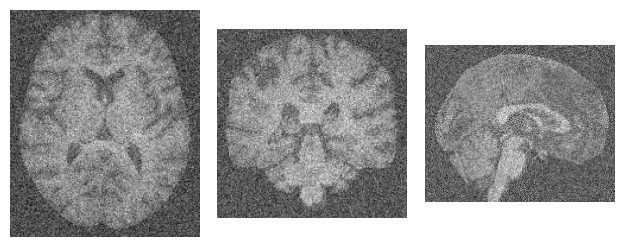

In [10]:
noise = tio.RandomNoise(std=(0.2, 0.2))
# noise = tio.RandomNoise(std= 0.)
X_volume = noise(X_volumes[0])

dim=80
fig, axs = plt.subplots(1,3)
axs = axs.flatten()
axs[0].imshow(ndimage.rotate(X_volume[0,:,:,dim], 90), cmap='gray')
axs[0].grid()
axs[0].axis('off')
axs[1].imshow(ndimage.rotate(X_volume[0,:,dim,:], 90), cmap='gray')
axs[1].grid()
axs[1].axis('off')
axs[2].imshow(ndimage.rotate(X_volume[0,dim,:,:], 90), cmap='gray')
axs[2].grid()
axs[2].axis('off')
plt.tight_layout()
print((X_volumes[0] == X_volume).all())

In [11]:
# Measures to try: RandomAnisotropy, RandomMotion, RandomGhosting, RandomSpike, RandomBiasField, RandomGamma
# Measures to try First: RandomAnisotropy, RandomBiasField

# For noise, std = [0, 0.01, 0.02, 0.04, 0.06, 0.08, 0.1, 0.12, 0.14 0.16, 0.18, 0.2]

(1, 160, 192, 160) 0.0 1.0084594 0.18027219 0.23889278
False


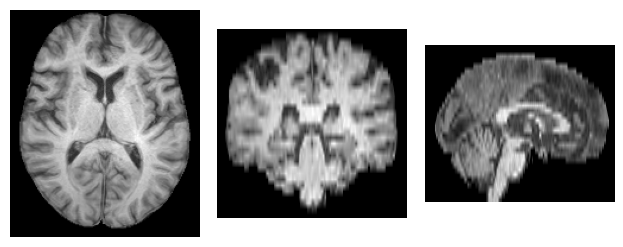

In [12]:
random_anisotropy = tio.RandomAnisotropy(axes=(0,1,2), downsampling=(5,5))
X_volume = random_anisotropy(X_volumes[0])
print(X_volume.shape, X_volume.min(), X_volume.max(), X_volume.mean(), X_volume.std())

dim=80
fig, axs = plt.subplots(1,3)
axs = axs.flatten()
axs[0].imshow(ndimage.rotate(X_volume[0,:,:,dim], 90), cmap='gray')
axs[0].grid()
axs[0].axis('off')
axs[1].imshow(ndimage.rotate(X_volume[0,:,dim,:], 90), cmap='gray')
axs[1].grid()
axs[1].axis('off')
axs[2].imshow(ndimage.rotate(X_volume[0,dim,:,:], 90), cmap='gray')
axs[2].grid()
axs[2].axis('off')
plt.tight_layout()
print((X_volumes[0] == X_volume).all())

In [13]:
(X_volumes[0] == X_volume).all()

False

(1, 160, 192, 160)
False


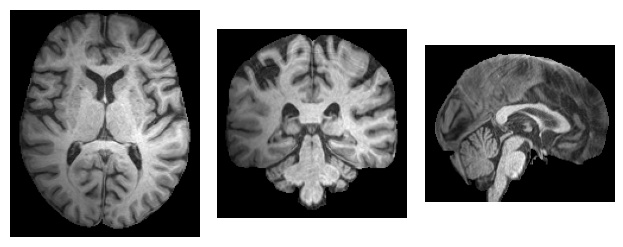

In [14]:
random_biasField = tio.RandomBiasField(coefficients=0.4)#(axes=(0,1,2), downsampling=10)
# random_biasField = tio.RandomBiasField(order=1)#(axes=(0,1,2), downsampling=10)
X_volume = random_biasField(X_volumes[0])
print(X_volume.shape)

dim=80
fig, axs = plt.subplots(1,3)
axs = axs.flatten()
axs[0].imshow(ndimage.rotate(X_volume[0,:,:,dim], 90), cmap='gray')
axs[0].grid()
axs[0].axis('off')
axs[1].imshow(ndimage.rotate(X_volume[0,:,dim,:], 90), cmap='gray')
axs[1].grid()
axs[1].axis('off')
axs[2].imshow(ndimage.rotate(X_volume[0,dim,:,:], 90), cmap='gray')
axs[2].grid()
axs[2].axis('off')
plt.tight_layout()
print((X_volumes[0] == X_volume).all())

(1, 160, 192, 160)
False


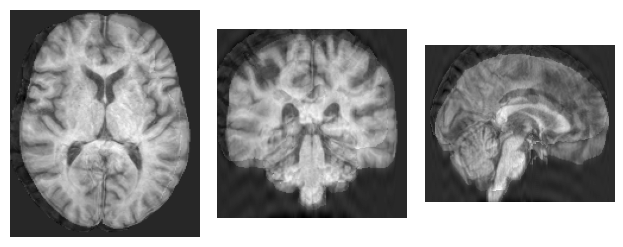

In [15]:
random_motion = tio.RandomMotion(num_transforms=1, image_interpolation='nearest')#
X_volume = random_motion(X_volumes[0])
print(X_volume.shape)

dim=80
fig, axs = plt.subplots(1,3)
axs = axs.flatten()
axs[0].imshow(ndimage.rotate(X_volume[0,:,:,dim], 90), cmap='gray')
axs[0].grid()
axs[0].axis('off')
axs[1].imshow(ndimage.rotate(X_volume[0,:,dim,:], 90), cmap='gray')
axs[1].grid()
axs[1].axis('off')
axs[2].imshow(ndimage.rotate(X_volume[0,dim,:,:], 90), cmap='gray')
axs[2].grid()
axs[2].axis('off')
plt.tight_layout()
print((X_volumes[0] == X_volume).all())

(1, 160, 192, 160)
False


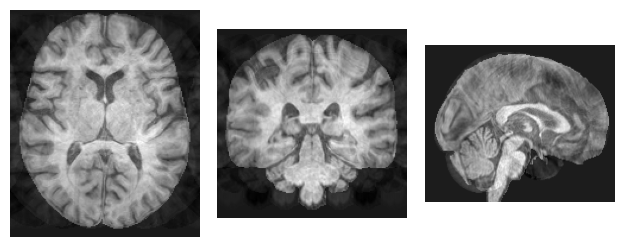

In [16]:
# kwargs = {'seed': 0}

# torch.manual_seed(42)
random_ghosting = tio.RandomGhosting(intensity=(1.2, 1.2)) #, **kwargs)#(num_transforms=5, image_interpolation='nearest')#
X_volume = random_ghosting(X_volumes[0])
print(X_volume.shape)

dim=80
fig, axs = plt.subplots(1,3)
axs = axs.flatten()
axs[0].imshow(ndimage.rotate(X_volume[0,:,:,dim], 90), cmap='gray')
axs[0].grid()
axs[0].axis('off')
axs[1].imshow(ndimage.rotate(X_volume[0,:,dim,:], 90), cmap='gray')
axs[1].grid()
axs[1].axis('off')
axs[2].imshow(ndimage.rotate(X_volume[0,dim,:,:], 90), cmap='gray')
axs[2].grid()
axs[2].axis('off')
plt.tight_layout()
print((X_volumes[0] == X_volume).all())

In [17]:
fix_seed = True

(1, 160, 192, 160)
False
(1, 160, 192, 160)
False
(1, 160, 192, 160)
False


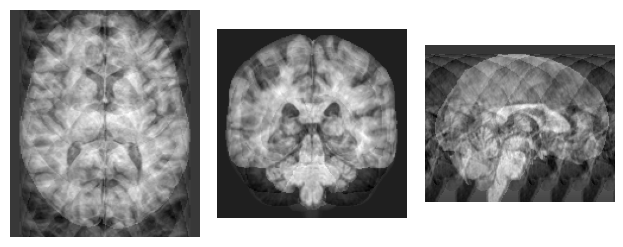

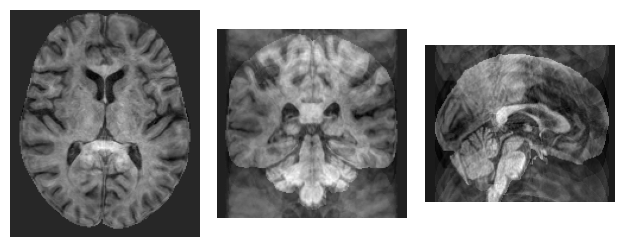

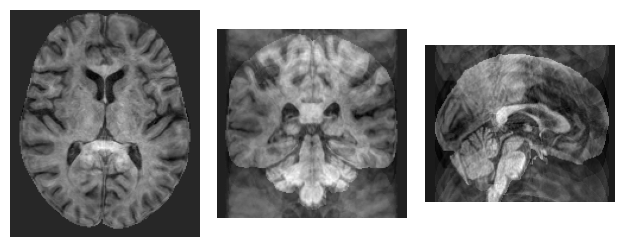

In [18]:
if fix_seed == True:
    torch.manual_seed(42)
    random_ghosting = tio.RandomGhosting(intensity=2) #, **kwargs)#(num_transforms=5, image_interpolation='nearest')#

X_volume = random_ghosting(X_volumes[0])
print(X_volume.shape)
dim=80
fig, axs = plt.subplots(1,3)
axs = axs.flatten()
axs[0].imshow(ndimage.rotate(X_volume[0,:,:,dim], 90), cmap='gray')
axs[0].grid()
axs[0].axis('off')
axs[1].imshow(ndimage.rotate(X_volume[0,:,dim,:], 90), cmap='gray')
axs[1].grid()
axs[1].axis('off')
axs[2].imshow(ndimage.rotate(X_volume[0,dim,:,:], 90), cmap='gray')
axs[2].grid()
axs[2].axis('off')
plt.tight_layout()
print((X_volumes[0] == X_volume).all())
X_volume = random_ghosting(X_volumes[0])
print(X_volume.shape)
dim=80
fig, axs = plt.subplots(1,3)
axs = axs.flatten()
axs[0].imshow(ndimage.rotate(X_volume[0,:,:,dim], 90), cmap='gray')
axs[0].grid()
axs[0].axis('off')
axs[1].imshow(ndimage.rotate(X_volume[0,:,dim,:], 90), cmap='gray')
axs[1].grid()
axs[1].axis('off')
axs[2].imshow(ndimage.rotate(X_volume[0,dim,:,:], 90), cmap='gray')
axs[2].grid()
axs[2].axis('off')
plt.tight_layout()
print((X_volumes[0] == X_volume).all())
X_volume = random_ghosting(X_volumes[0])
print(X_volume.shape)
dim=80
fig, axs = plt.subplots(1,3)
axs = axs.flatten()
axs[0].imshow(ndimage.rotate(X_volume[0,:,:,dim], 90), cmap='gray')
axs[0].grid()
axs[0].axis('off')
axs[1].imshow(ndimage.rotate(X_volume[0,:,dim,:], 90), cmap='gray')
axs[1].grid()
axs[1].axis('off')
axs[2].imshow(ndimage.rotate(X_volume[0,dim,:,:], 90), cmap='gray')
axs[2].grid()
axs[2].axis('off')
plt.tight_layout()
print((X_volumes[0] == X_volume).all())

(1, 160, 192, 160)
False
(1, 160, 192, 160)
False
(1, 160, 192, 160)
False


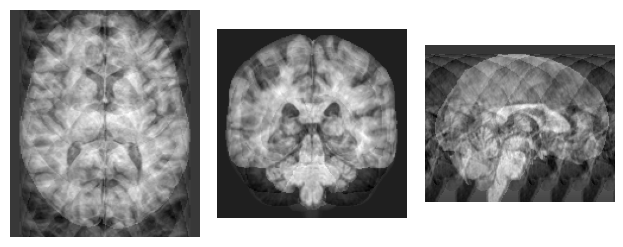

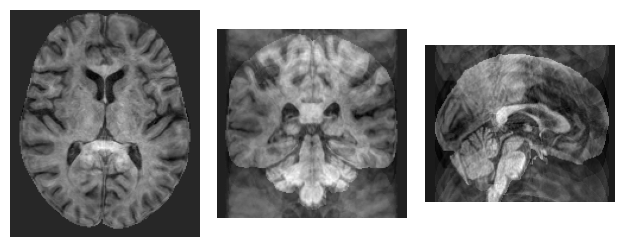

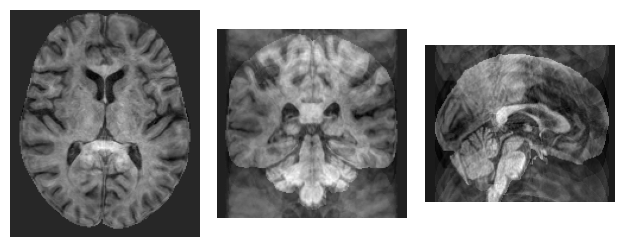

In [19]:
if fix_seed == True:
    torch.manual_seed(42)
    random_ghosting = tio.RandomGhosting(intensity=2) #, **kwargs)#(num_transforms=5, image_interpolation='nearest')#

X_volume = random_ghosting(X_volumes[0])
print(X_volume.shape)
dim=80
fig, axs = plt.subplots(1,3)
axs = axs.flatten()
axs[0].imshow(ndimage.rotate(X_volume[0,:,:,dim], 90), cmap='gray')
axs[0].grid()
axs[0].axis('off')
axs[1].imshow(ndimage.rotate(X_volume[0,:,dim,:], 90), cmap='gray')
axs[1].grid()
axs[1].axis('off')
axs[2].imshow(ndimage.rotate(X_volume[0,dim,:,:], 90), cmap='gray')
axs[2].grid()
axs[2].axis('off')
plt.tight_layout()
print((X_volumes[0] == X_volume).all())
X_volume = random_ghosting(X_volumes[0])
print(X_volume.shape)
dim=80
fig, axs = plt.subplots(1,3)
axs = axs.flatten()
axs[0].imshow(ndimage.rotate(X_volume[0,:,:,dim], 90), cmap='gray')
axs[0].grid()
axs[0].axis('off')
axs[1].imshow(ndimage.rotate(X_volume[0,:,dim,:], 90), cmap='gray')
axs[1].grid()
axs[1].axis('off')
axs[2].imshow(ndimage.rotate(X_volume[0,dim,:,:], 90), cmap='gray')
axs[2].grid()
axs[2].axis('off')
plt.tight_layout()
print((X_volumes[0] == X_volume).all())
X_volume = random_ghosting(X_volumes[0])
print(X_volume.shape)
dim=80
fig, axs = plt.subplots(1,3)
axs = axs.flatten()
axs[0].imshow(ndimage.rotate(X_volume[0,:,:,dim], 90), cmap='gray')
axs[0].grid()
axs[0].axis('off')
axs[1].imshow(ndimage.rotate(X_volume[0,:,dim,:], 90), cmap='gray')
axs[1].grid()
axs[1].axis('off')
axs[2].imshow(ndimage.rotate(X_volume[0,dim,:,:], 90), cmap='gray')
axs[2].grid()
axs[2].axis('off')
plt.tight_layout()
print((X_volumes[0] == X_volume).all())

(1, 160, 192, 160)
False


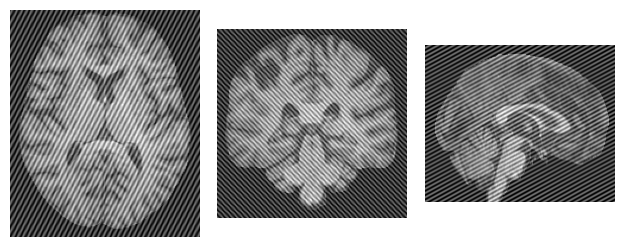

In [20]:
random_spike = tio.RandomSpike(intensity=(2,2))
X_volume = random_spike(X_volumes[0])
print(X_volume.shape)

dim=80
fig, axs = plt.subplots(1,3)
axs = axs.flatten()
axs[0].imshow(ndimage.rotate(X_volume[0,:,:,dim], 90), cmap='gray')
axs[0].grid()
axs[0].axis('off')
axs[1].imshow(ndimage.rotate(X_volume[0,:,dim,:], 90), cmap='gray')
axs[1].grid()
axs[1].axis('off')
axs[2].imshow(ndimage.rotate(X_volume[0,dim,:,:], 90), cmap='gray')
axs[2].grid()
axs[2].axis('off')
plt.tight_layout()
print((X_volumes[0] == X_volume).all())

(1, 160, 192, 160) -0.0022286398 1.5294039 0.18017681 0.24336451
True


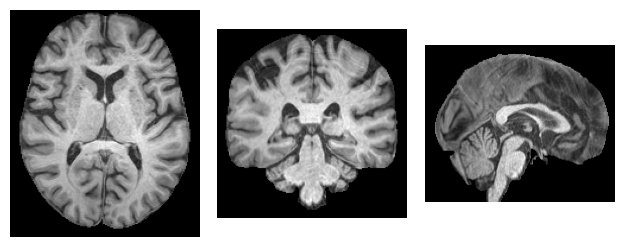

In [21]:
random_gamma = tio.RandomGamma(log_gamma=(0,0))
X_volume = random_gamma(X_volumes[0])
print(X_volume.shape, X_volume.min(), X_volume.max(), X_volume.mean(), X_volume.std())

dim=80
fig, axs = plt.subplots(1,3)
axs = axs.flatten()
axs[0].imshow(ndimage.rotate(X_volume[0,:,:,dim], 90), cmap='gray')
axs[0].grid()
axs[0].axis('off')
axs[1].imshow(ndimage.rotate(X_volume[0,:,dim,:], 90), cmap='gray')
axs[1].grid()
axs[1].axis('off')
axs[2].imshow(ndimage.rotate(X_volume[0,dim,:,:], 90), cmap='gray')
axs[2].grid()
axs[2].axis('off')
plt.tight_layout()
print((X_volumes[0] == X_volume).all())

(1, 160, 192, 160) -0.0022286398 1.1076328 0.17988418 0.24159665
False


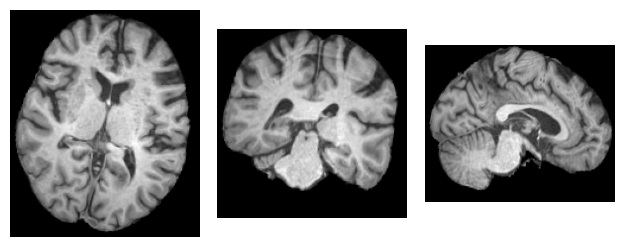

In [22]:
# RandomAffine

metric = 10

random_gamma = tio.RandomAffine(scales = 0, degrees=metric, )
X_volume = random_gamma(X_volumes[0])
print(X_volume.shape, X_volume.min(), X_volume.max(), X_volume.mean(), X_volume.std())

dim=80
fig, axs = plt.subplots(1,3)
axs = axs.flatten()
axs[0].imshow(ndimage.rotate(X_volume[0,:,:,dim], 90), cmap='gray')
axs[0].grid()
axs[0].axis('off')
axs[1].imshow(ndimage.rotate(X_volume[0,:,dim,:], 90), cmap='gray')
axs[1].grid()
axs[1].axis('off')
axs[2].imshow(ndimage.rotate(X_volume[0,dim,:,:], 90), cmap='gray')
axs[2].grid()
axs[2].axis('off')
plt.tight_layout()
print((X_volumes[0] == X_volume).all())

In [23]:
# !ls ../../../../SwinAgeMapper/datasets

False


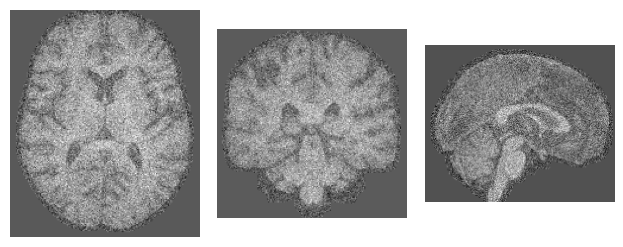

In [24]:
# RandomNoiseMask

metric = 0.2

noise = tio.RandomNoise(std=(metric, metric))
mask_path = '../../../../SwinAgeMapper/datasets/MNI152_T1_1mm_brain_mask_dil.nii.gz'
crop_values = [10, 170, 12, 204, 0, 160]
mask = np.array(nib.load(mask_path).dataobj)
mask = mask[crop_values[0]:crop_values[1],
                crop_values[2]:crop_values[3], 
                crop_values[4]:crop_values[5]]
# noise = tio.RandomNoise(std= 0.)
X_volume = np.multiply(mask,noise(X_volumes[0]))

dim=80
fig, axs = plt.subplots(1,3)
axs = axs.flatten()
axs[0].imshow(ndimage.rotate(X_volume[0,:,:,dim], 90), cmap='gray')
axs[0].grid()
axs[0].axis('off')
axs[1].imshow(ndimage.rotate(X_volume[0,:,dim,:], 90), cmap='gray')
axs[1].grid()
axs[1].axis('off')
axs[2].imshow(ndimage.rotate(X_volume[0,dim,:,:], 90), cmap='gray')
axs[2].grid()
axs[2].axis('off')
plt.tight_layout()
print((X_volumes[0] == X_volume).all())

In [25]:
def transform(X_volumes, idx, transf, metric):

    if transf == 'noise':
        randomTransform = tio.RandomNoise(mean=0., std=(metric, metric))
    elif transf == 'RandomAnisotropy':
        randomTransform = tio.RandomAnisotropy(downsampling=(metric, metric))
    elif transf =='RandomMotion':
        randomTransform = tio.RandomMotion(num_transforms=metric, image_interpolation='nearest')
    elif transf == 'RandomGhosting':
        randomTransform = tio.RandomGhosting(intensity=(metric, metric))
    elif transf =='RandomSpike':
        randomTransform = tio.RandomSpike(intensity=(metric, metric))
    elif transf =='RandomBiasField':
        randomTransform = tio.RandomBiasField(coefficients=metric)
    elif transf =='RandomGamma': # Possibly Realistic
        randomTransform = tio.RandomGamma(log_gamma=metric)
    else:
        randomTransform = None
        
        

    X_volume = X_volumes[idx]
    
#     print(X_volume.size)
    
    if randomTransform is not None:
        X_volume = randomTransform(X_volume)
        
    if idx in [3, 4]:
        dim = 45
    else:
        dim = 80

    fig, axs = plt.subplots(1,3)
    axs = axs.flatten()
    axs[0].imshow(ndimage.rotate(X_volume[0,:,:,dim], 90), cmap='gray')
    axs[0].grid()
    axs[0].axis('off')
    axs[1].imshow(ndimage.rotate(X_volume[0,:,dim,:], 90), cmap='gray')
    axs[1].grid()
    axs[1].axis('off')
    axs[2].imshow(ndimage.rotate(X_volume[0,dim,:,:], 90), cmap='gray')
    axs[2].grid()
    axs[2].axis('off')
    plt.tight_layout()
    fig.suptitle(str(metric), y=0.8)

In [26]:
X_volumes[0].shape

(1, 160, 192, 160)

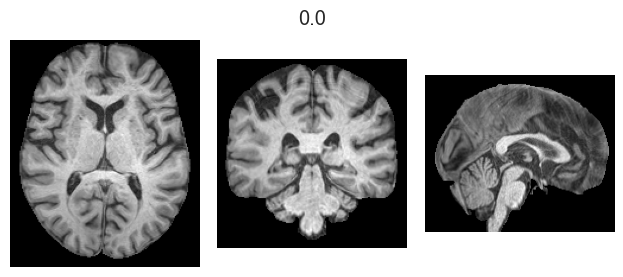

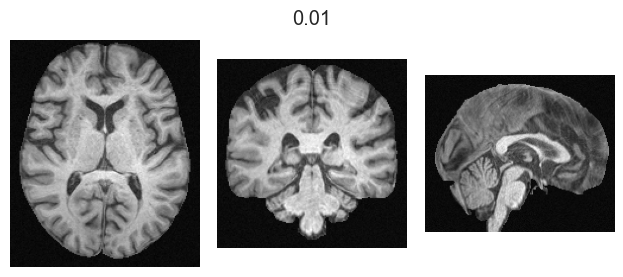

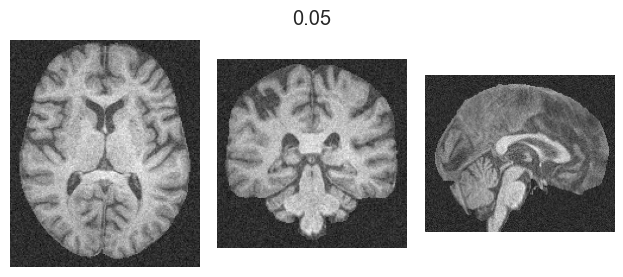

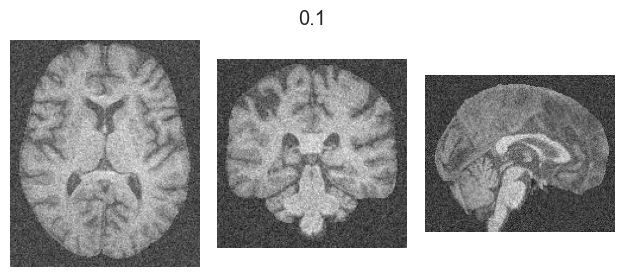

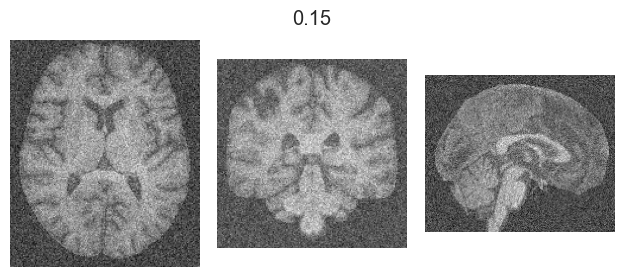

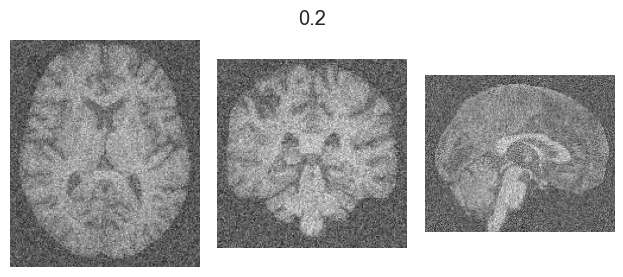

In [27]:
for mt in [0., 0.01, 0.05, 0.1, 0.15, 0.2]:
    transform(X_volumes, idx=0, transf='noise', metric=mt)

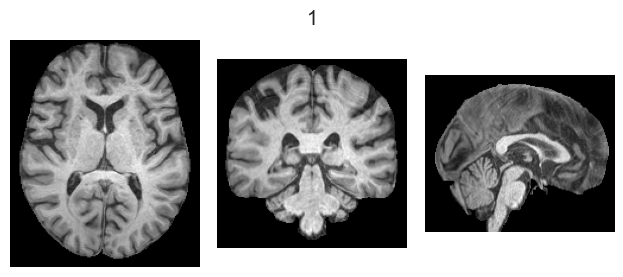

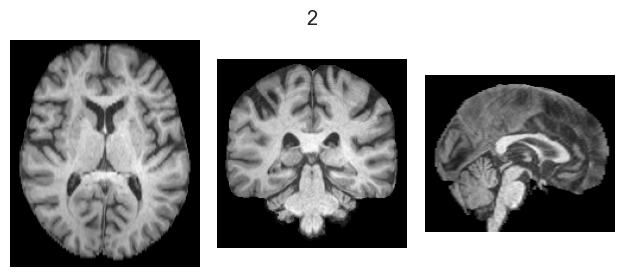

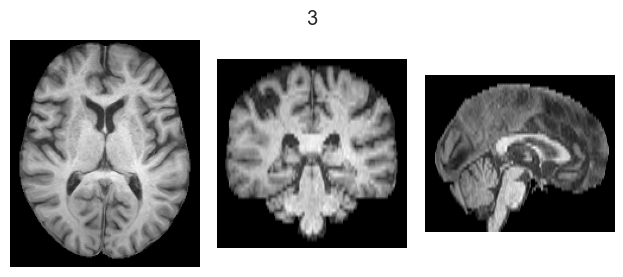

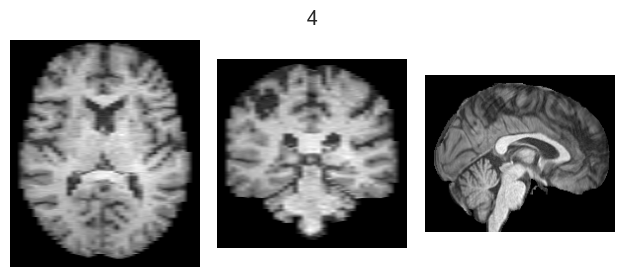

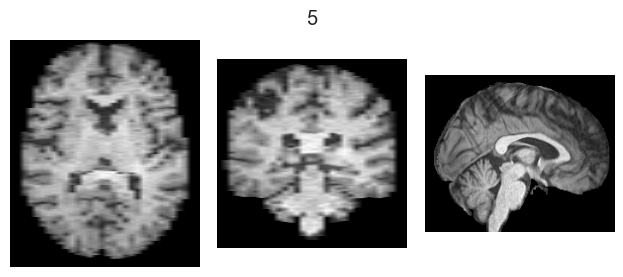

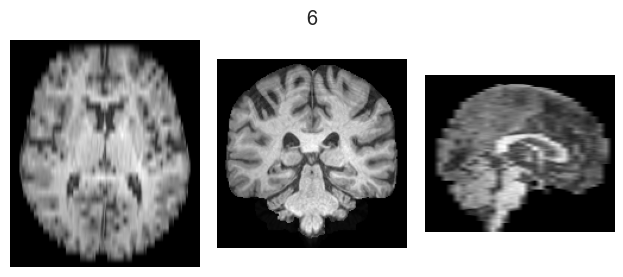

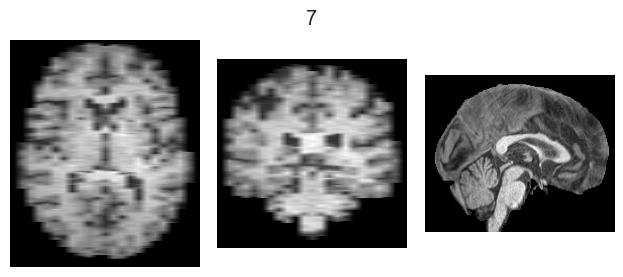

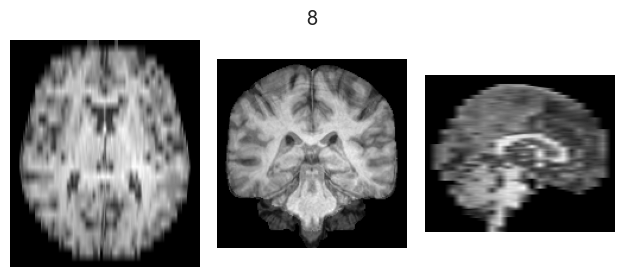

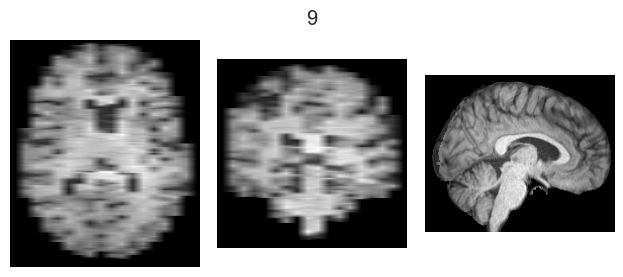

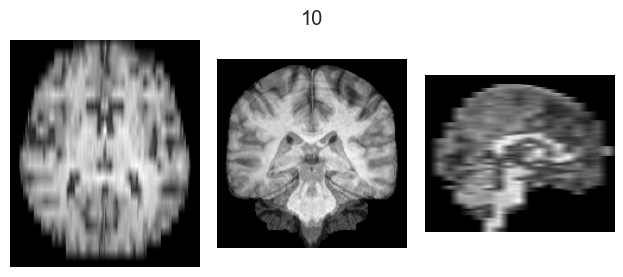

In [28]:
for mt in [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]:
    transform(X_volumes, idx=0, transf='RandomAnisotropy', metric=mt) ### value of 1 means no change!

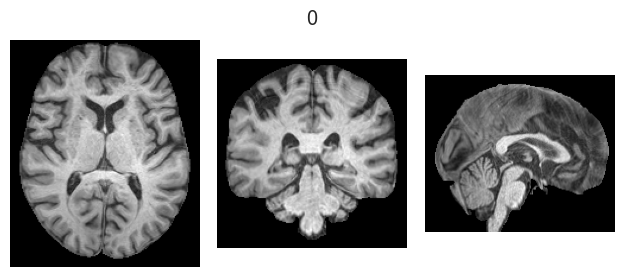

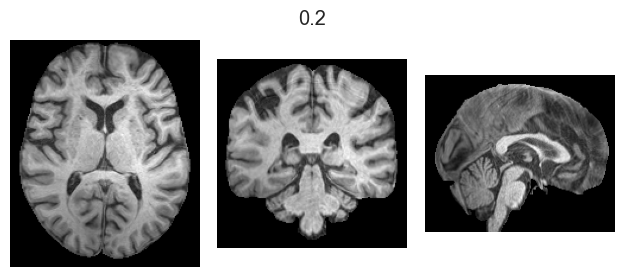

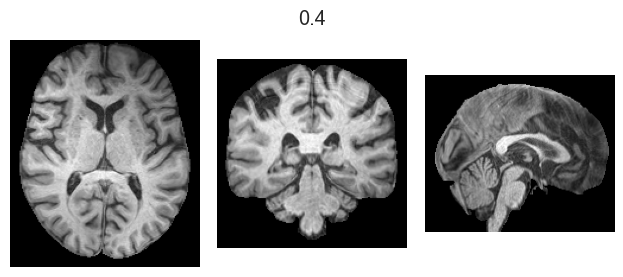

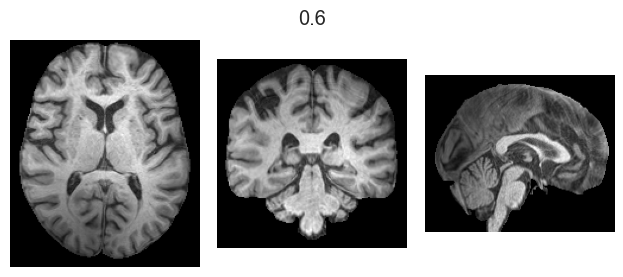

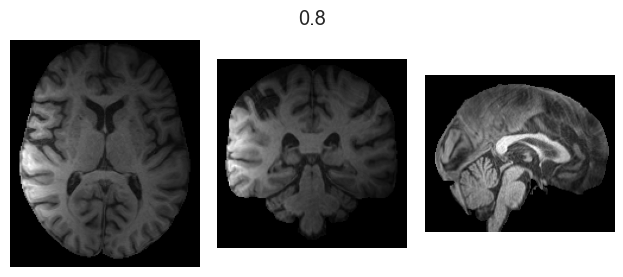

...

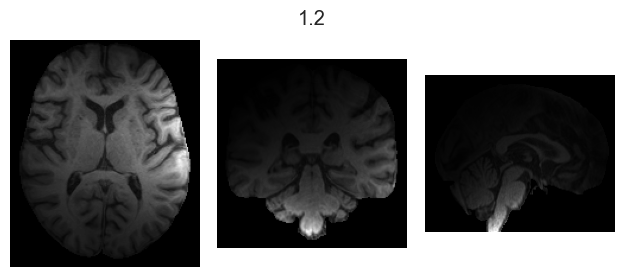

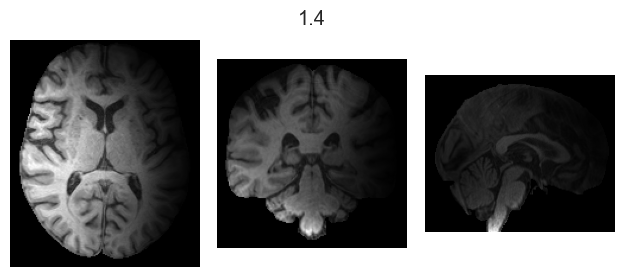

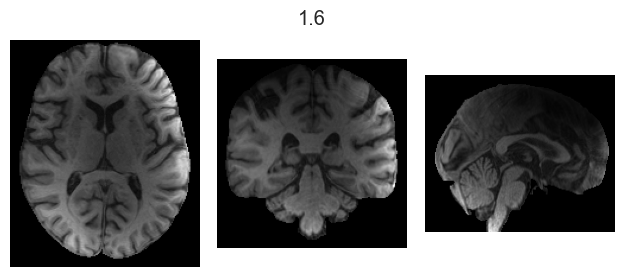

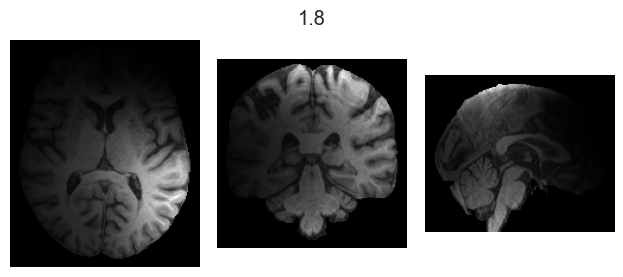

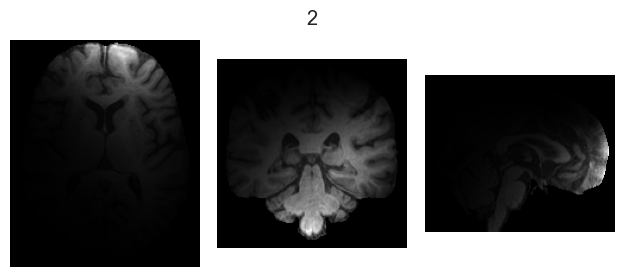

In [29]:
for mt in [0, .2, .4, .6, .8, 1, 1.2, 1.4, 1.6, 1.8, 2]:
    transform(X_volumes, idx=0, transf='RandomBiasField', metric=mt) ### value of 0 means no change!

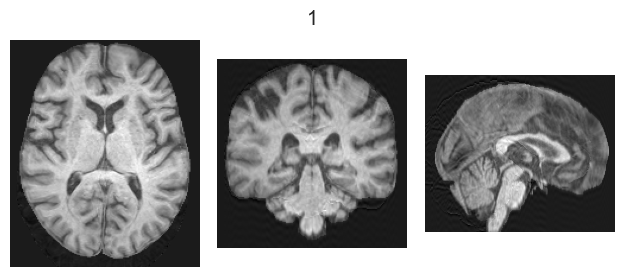

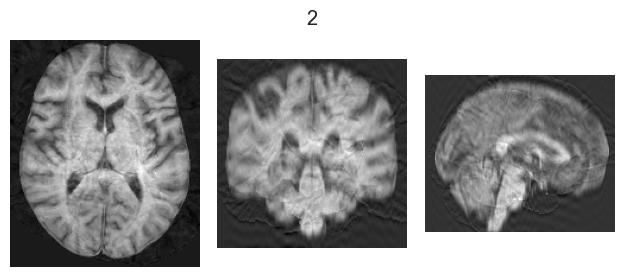

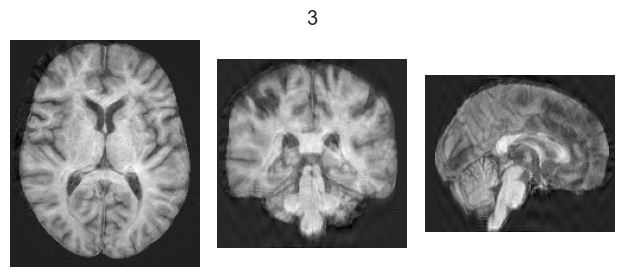

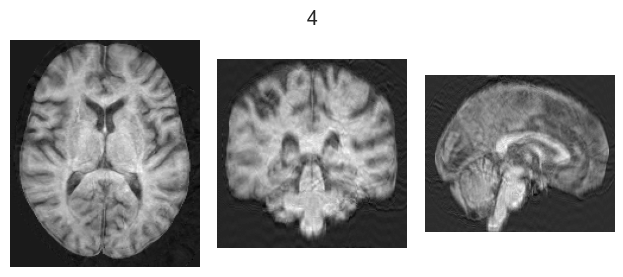

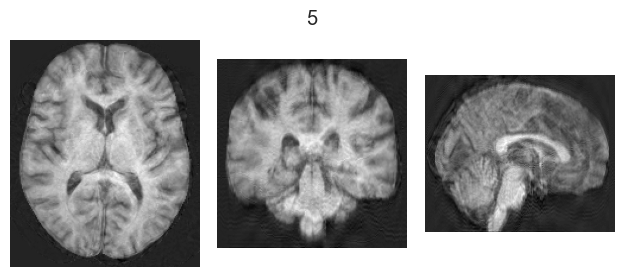

In [30]:
for mt in [1,2,3,4,5]:
    transform(X_volumes, idx=0, transf='RandomMotion', metric=mt) ### NO CASE WITH 0 CHANGES

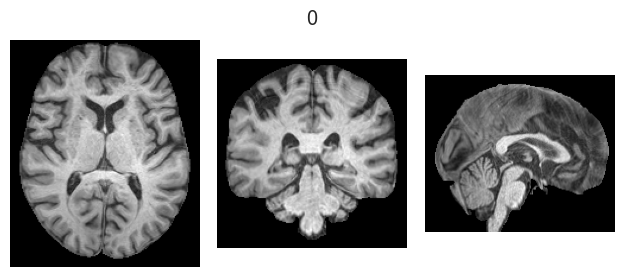

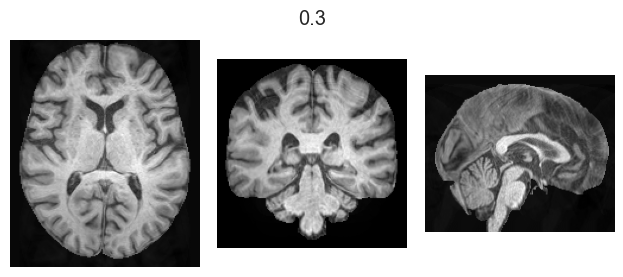

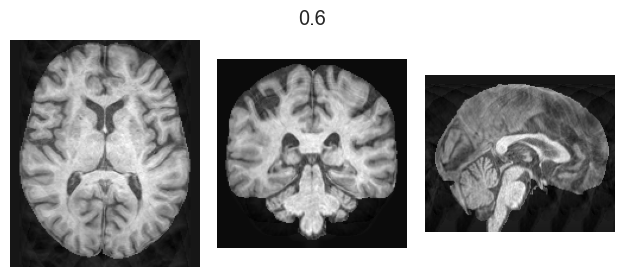

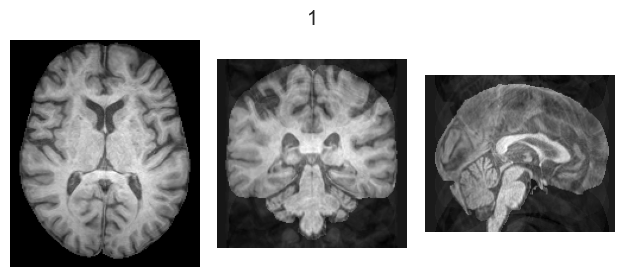

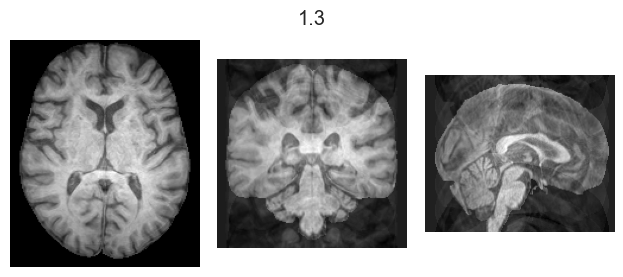

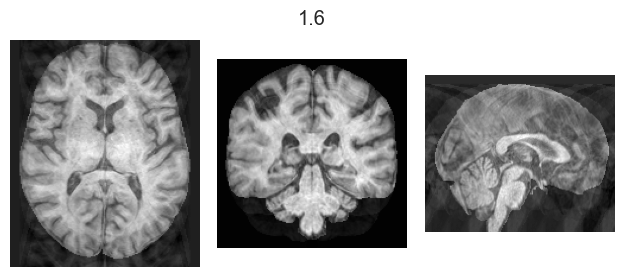

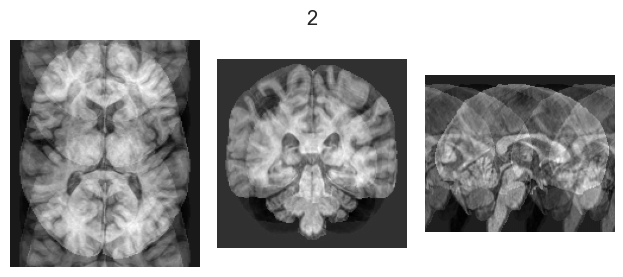

In [31]:
for mt in [0, .3, .6, 1, 1.3, 1.6, 2]:
    transform(X_volumes, idx=0, transf='RandomGhosting', metric=mt) ### value of 0 means no change!

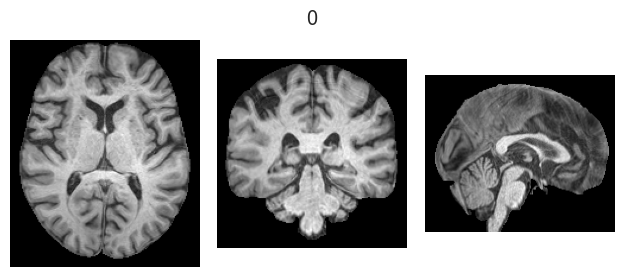

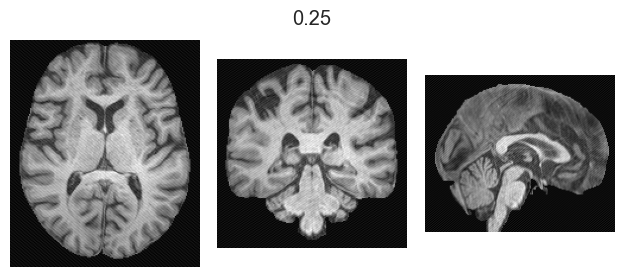

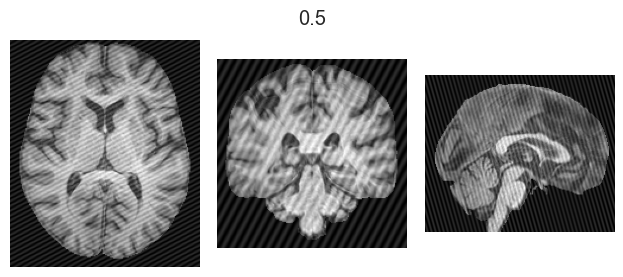

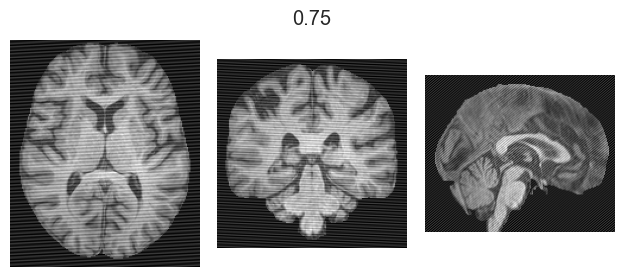

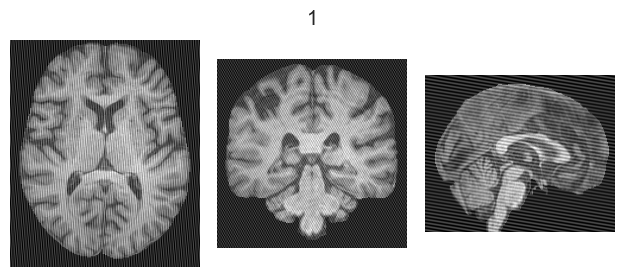

...

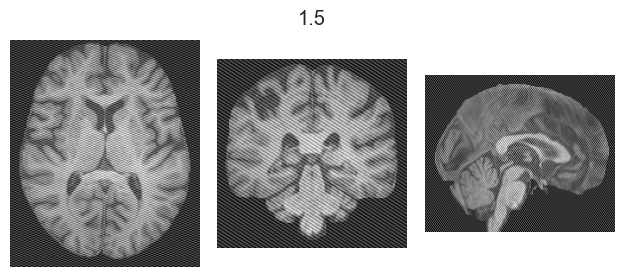

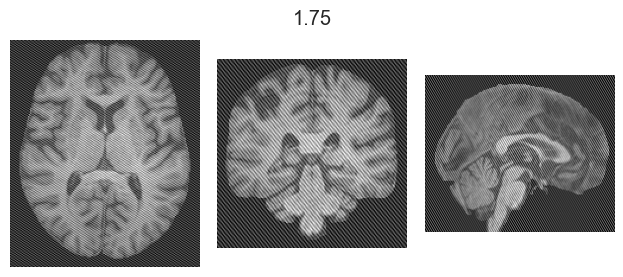

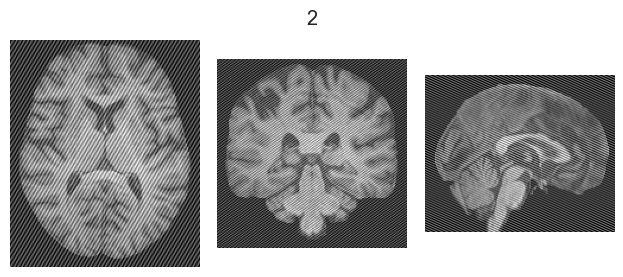

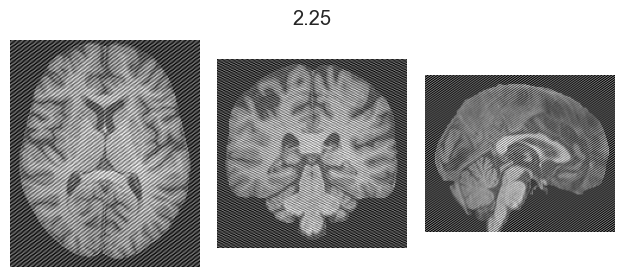

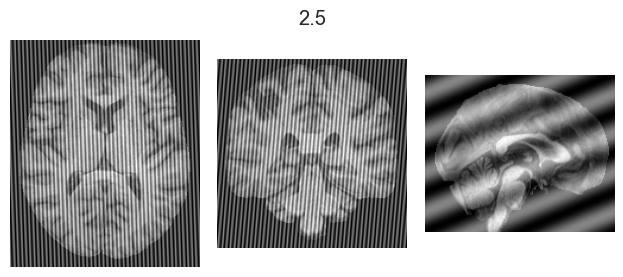

In [32]:
for mt in [0, 0.25, 0.5, 0.75, 1, 1.25, 1.5, 1.75, 2, 2.25, 2.5]:
    transform(X_volumes, idx=0, transf='RandomSpike', metric=mt) ### value of 0 means no change! (???)

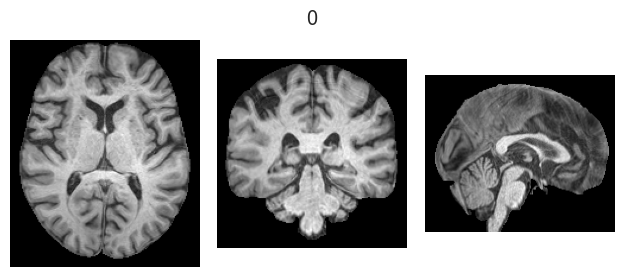

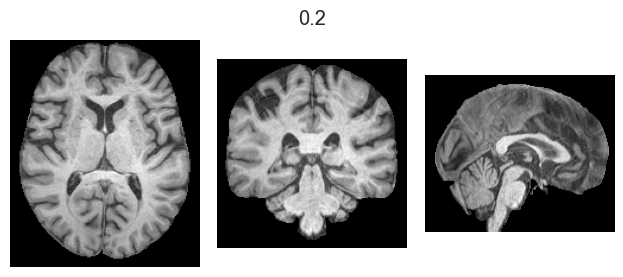

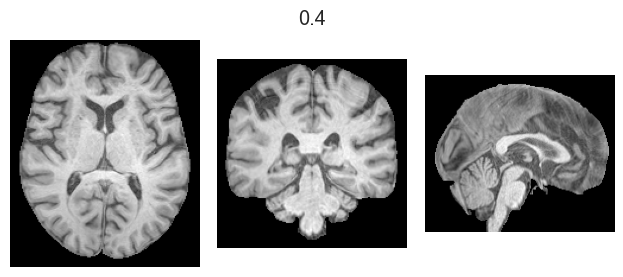

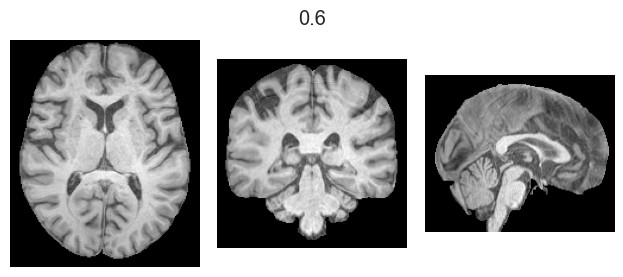

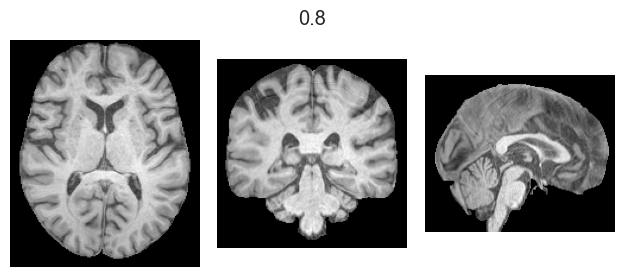

...

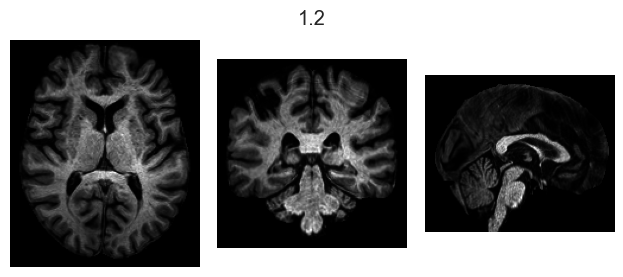

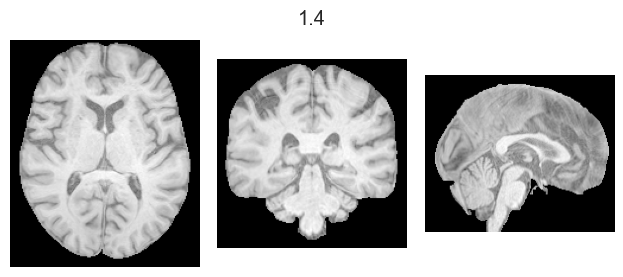

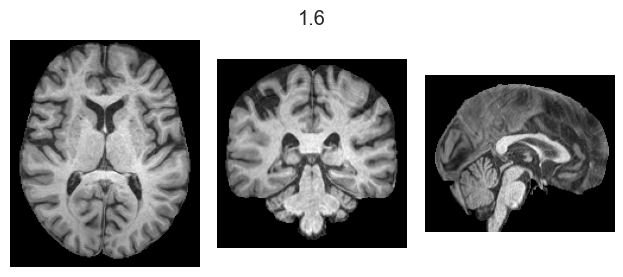

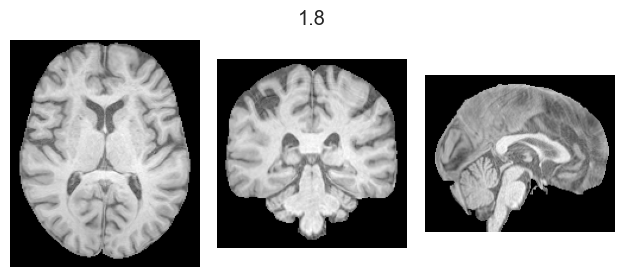

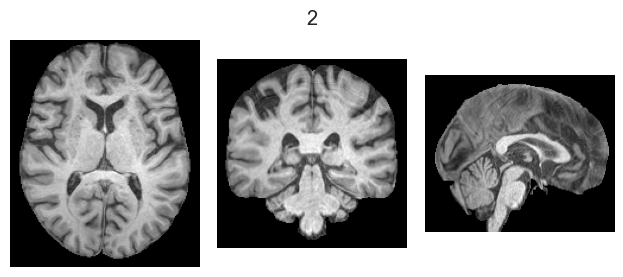

In [33]:
for mt in [0, .2, .4, .6, .8, 1, 1.2, 1.4, 1.6, 1.8, 2]:
    transform(X_volumes, idx=0, transf='RandomGamma', metric=mt) ### value of 0 means no change! 


In [44]:

def ThesisPlot(X_volumes, idx, transf, metric=[0.05, 0.1, 0.15], title=None):

    title_font_size=22
    ticks_font_size=18
    legend_font = 18

    ncols=3
    nrows=3
    sz=7.2

    fig, axs = plt.subplots(ncols=ncols,nrows=nrows,figsize=(ncols*sz,nrows*sz*1.25))
    axs = axs.flatten()
    
    if transf == 'noise':
        randomTransform = tio.RandomNoise(mean=0., std=(metric[0], metric[0]))
        randomTransform2 = tio.RandomNoise(mean=0., std=(metric[1], metric[1]))
        randomTransform3 = tio.RandomNoise(mean=0., std=(metric[2], metric[2]))
        metricTxt = 'Strd = '
    elif transf == 'RandomAnisotropy':
        randomTransform = tio.RandomAnisotropy(downsampling=(metric[0], metric[0]))
        randomTransform2 = tio.RandomAnisotropy(downsampling=(metric[1], metric[1]))
        randomTransform3 = tio.RandomAnisotropy(downsampling=(metric[2], metric[2]))
        metricTxt = 'Downsampling = '
    elif transf =='RandomBiasField':
        randomTransform = tio.RandomBiasField(coefficients=metric[0])
        randomTransform2 = tio.RandomBiasField(coefficients=metric[1])
        randomTransform3 = tio.RandomBiasField(coefficients=metric[2])
        metricTxt = 'Coefficients = '
    elif transf == 'RandomAffine':
        randomTransform = tio.RandomAffine(scales = 0, degrees=metric[0], )
        randomTransform2 = tio.RandomAffine(scales = 0, degrees=metric[1], )
        randomTransform3 = tio.RandomAffine(scales = 0, degrees=metric[2], )
        metricTxt = 'Degrees = '
    else:
        randomTransform = None
        randomTransform2 = None
        randomTransform3 = None
        metricTxt = None
        
    X_volume = X_volumes[idx]

    if randomTransform is not None:
        'NOISE WAS ADDED!!!'
        X_volume = randomTransform(X_volume)
        X_volume2 = randomTransform2(X_volume)
        X_volume3 = randomTransform3(X_volume)

    if idx in [3, 4]:
        dim = 45
    else:
        dim = 80

    axs[0].imshow(ndimage.rotate(X_volume[0,:,:,dim], 90), cmap='gray')
    axs[0].grid()
    axs[0].set_ylabel(metricTxt + str(metric[0]), fontsize=title_font_size*2)
    axs[0].axes.xaxis.set_ticklabels([])
    axs[0].axes.yaxis.set_ticklabels([])
    axs[1].imshow(ndimage.rotate(X_volume[0,:,dim,:], 90), cmap='gray')
    axs[1].grid()
    axs[1].axes.xaxis.set_ticklabels([])
    axs[1].axes.yaxis.set_ticklabels([])
    axs[2].imshow(ndimage.rotate(X_volume[0,dim,:,:], 90), cmap='gray')
    axs[2].grid()
    axs[2].axes.xaxis.set_ticklabels([])
    axs[2].axes.yaxis.set_ticklabels([])

    axs[3].imshow(ndimage.rotate(X_volume2[0,:,:,dim], 90), cmap='gray')
    axs[3].grid()
    axs[3].axes.xaxis.set_ticklabels([])
    axs[3].axes.yaxis.set_ticklabels([])
    axs[3].set_ylabel(metricTxt + str(metric[1]), fontsize=title_font_size*2)
    axs[4].imshow(ndimage.rotate(X_volume2[0,:,dim,:], 90), cmap='gray')
    axs[4].grid()
    axs[4].axes.xaxis.set_ticklabels([])
    axs[4].axes.yaxis.set_ticklabels([])
    axs[5].imshow(ndimage.rotate(X_volume2[0,dim,:,:], 90), cmap='gray')
    axs[5].grid()
    axs[5].axes.xaxis.set_ticklabels([])
    axs[5].axes.yaxis.set_ticklabels([])

    axs[6].imshow(ndimage.rotate(X_volume3[0,:,:,dim], 90), cmap='gray')
    axs[6].grid()
    axs[6].axes.xaxis.set_ticklabels([])
    axs[6].axes.yaxis.set_ticklabels([])
    axs[6].set_ylabel(metricTxt + str(metric[2]), fontsize=title_font_size*2)
    axs[7].imshow(ndimage.rotate(X_volume3[0,:,dim,:], 90), cmap='gray')
    axs[7].grid()
    axs[7].axes.xaxis.set_ticklabels([])
    axs[7].axes.yaxis.set_ticklabels([])
    axs[8].imshow(ndimage.rotate(X_volume3[0,dim,:,:], 90), cmap='gray')
    axs[8].grid()
    axs[8].axes.xaxis.set_ticklabels([])
    axs[8].axes.yaxis.set_ticklabels([])


    # plt.tight_layout()
    fig.subplots_adjust(wspace=0.01, hspace=0.01)
    fig.supxlabel(title, y=0.92, fontsize=title_font_size*2, verticalalignment='top')
    
    fig.savefig(title + '_' + transf + '.png', bbox_inches='tight', facecolor='white')


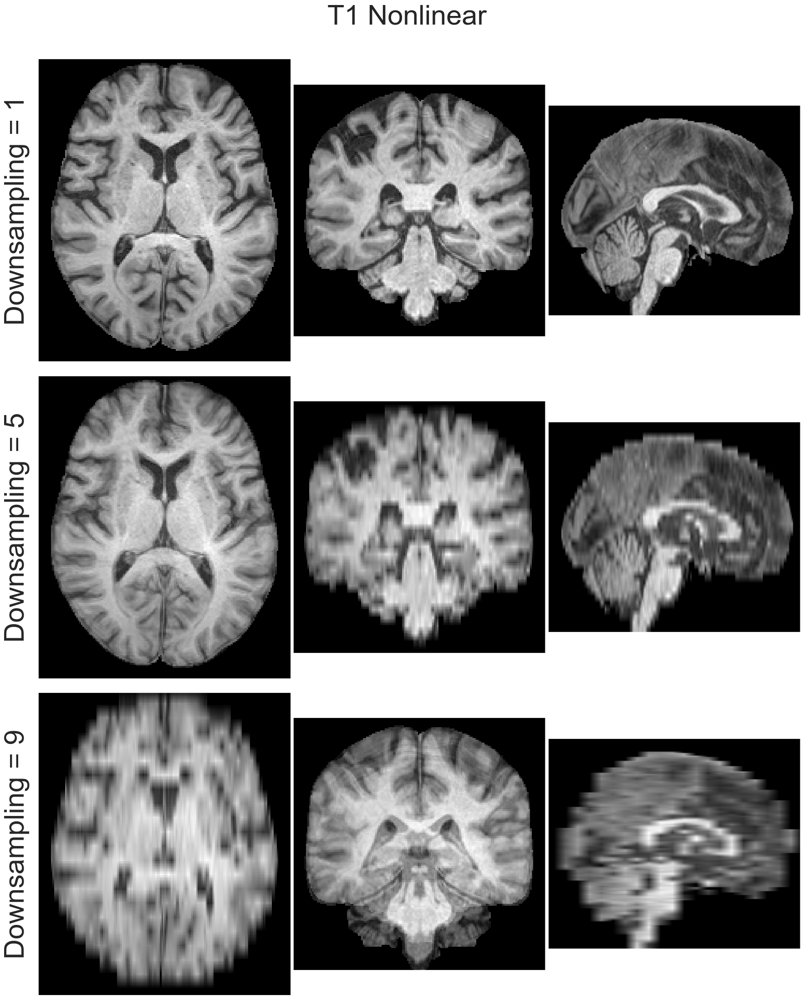

In [45]:
ThesisPlot(X_volumes, idx=0, transf='RandomAnisotropy', metric=[1, 5, 9], title='T1 Nonlinear')

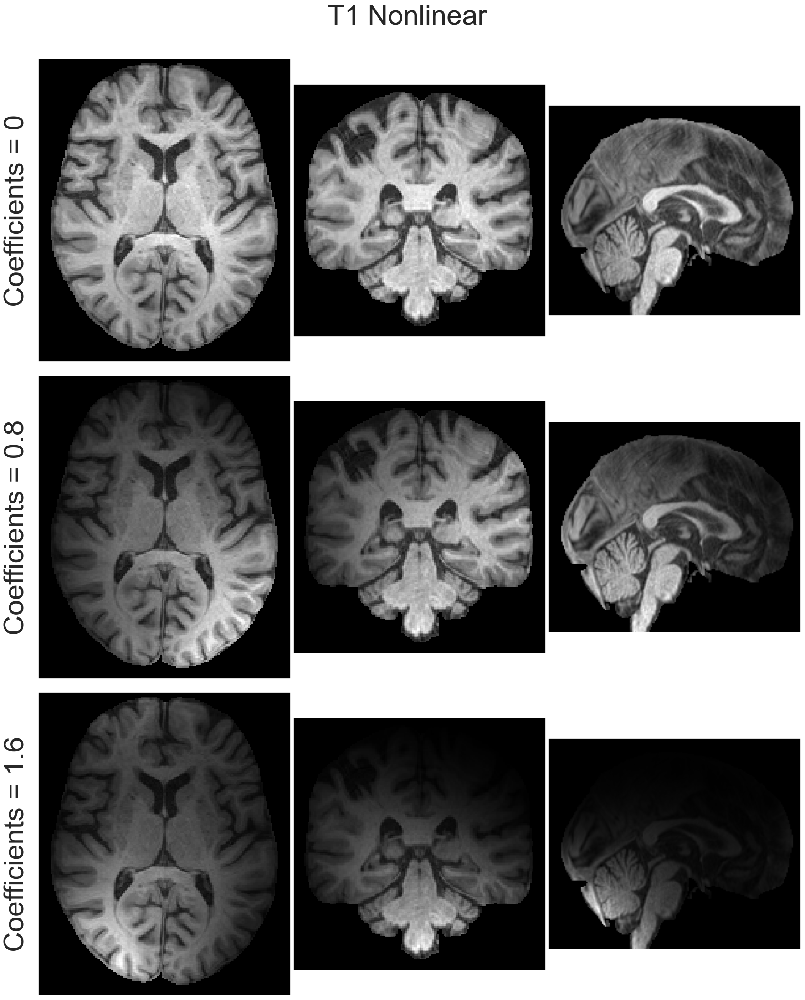

In [47]:
ThesisPlot(X_volumes, idx=0, transf='RandomBiasField', metric=[0, 0.8, 1.6], title='T1 Nonlinear')

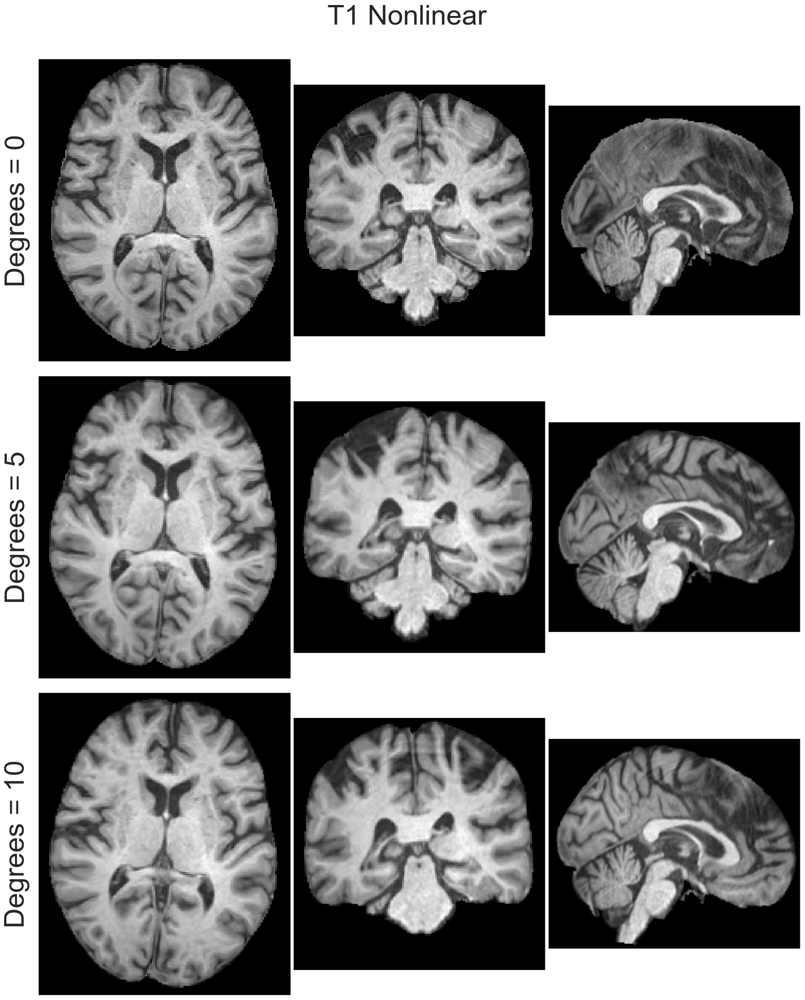

In [51]:
ThesisPlot(X_volumes, idx=0, transf='RandomAffine', metric=[0, 5, 10], title='T1 Nonlinear')